## Objective
Examine coactivations of electrodes in kilosort spikes to find patterns for prop
- 230726_kilosort_coactivations

In [1]:
%load_ext autoreload

In [2]:
from multiprocessing import Pool

import numpy as np
import matplotlib.pyplot as plt

from tqdm import tqdm

%autoreload 2
from src.sorters.kilosort import get_experts_kilosort
from src import utils, plot

In [3]:
KILOSORT = get_experts_kilosort(freq_max=3000)

/home/mea/anaconda3/envs/prop/lib/python3.7/site-packages/hdmf/spec/namespace.py:456: UserWarning: ignoring namespace 'hdmf-common' because it already exists
  warn("ignoring namespace '%s' because it already exists" % ns['name'])
/home/mea/anaconda3/envs/prop/lib/python3.7/site-packages/hdmf/spec/namespace.py:456: UserWarning: ignoring namespace 'core' because it already exists
  warn("ignoring namespace '%s' because it already exists" % ns['name'])
/data/MEAprojects/PropSignal/src/sorters/kilosort.py:156: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  spike_times = np.array([spikes1[idx] for idx in range(len(comp.match12)) if comp.match12[idx] != -1])


Recording does not have scaled traces. Setting gain to 0.195


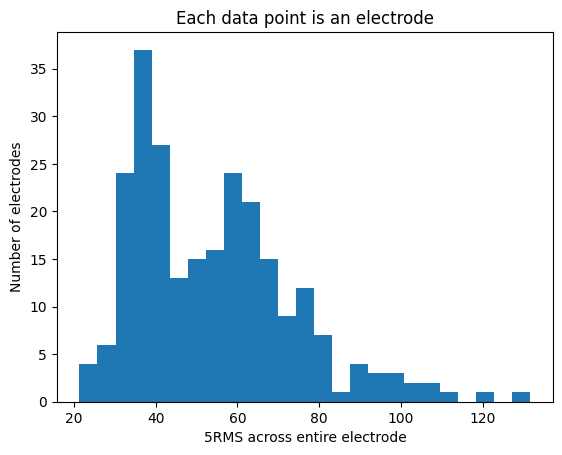

In [4]:
CHANS_RMS = utils.chans_rms_si()
RMS_THRESH = 5
##
plt.hist(CHANS_RMS * RMS_THRESH, bins=25)

plt.title("Each data point is an electrode")
plt.xlabel(f"{RMS_THRESH}RMS across entire electrode")
plt.ylabel("Number of electrodes")
plt.show()

In [5]:
ks_units = np.array([unit for unit in KILOSORT])

## Extract unit templates

In [6]:
NUM_WFS = 300
MS_BEFORE = 3
MS_AFTER = 3

np.random.seed(231)
##
def extract_templates(unit_idx):
    unit = ks_units[unit_idx]
    return unit_idx, unit.get_templates(num_wfs=NUM_WFS, ms_before=MS_BEFORE, ms_after=MS_AFTER)

with Pool(processes=12) as pool:
    for unit_idx, templates in tqdm(pool.imap(extract_templates, range(len(ks_units))), total=len(ks_units)):
        ks_units[unit_idx].templates = templates

  0%|          | 0/226 [00:00<?, ?it/s]

100%|██████████| 226/226 [01:19<00:00,  2.86it/s]


In [7]:
for unit in ks_units:
    unit.chan = np.argmin(np.min(unit.templates, axis=1))

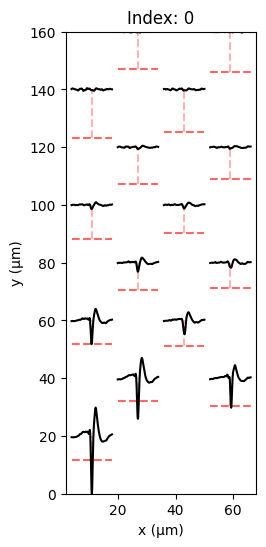

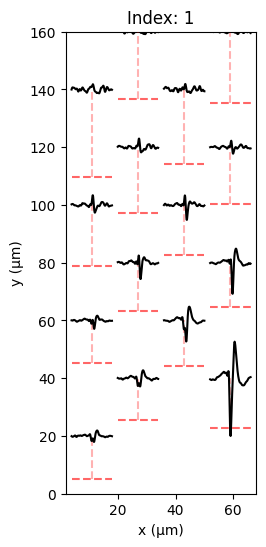

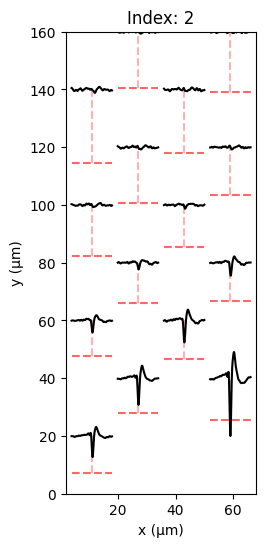

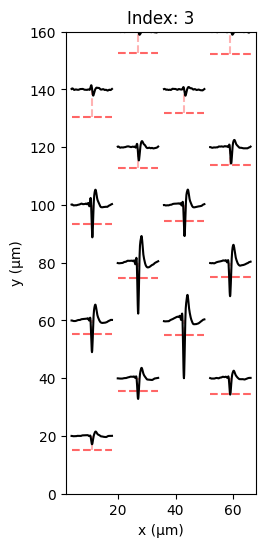

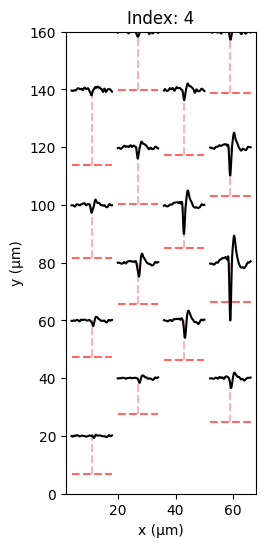

...

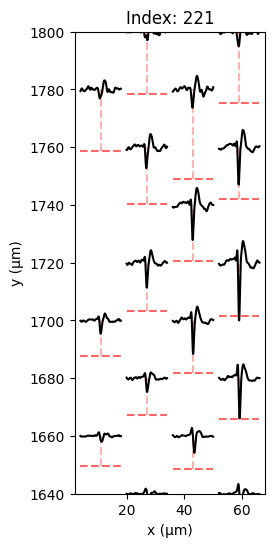

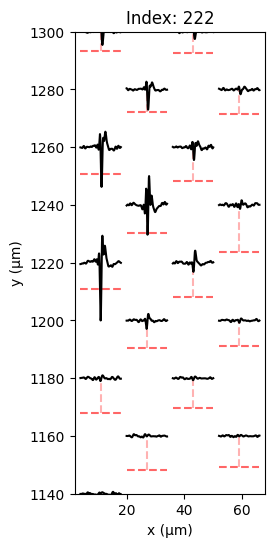

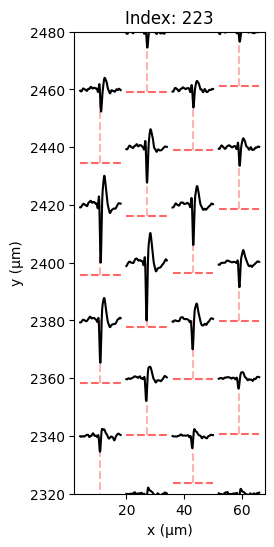

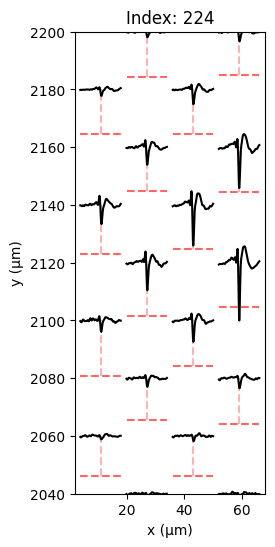

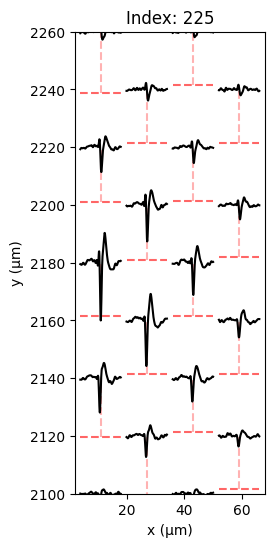

In [8]:
for unit in ks_units:
    unit.plot(chans_rms=CHANS_RMS)

## Case study

In [ ]:
UNIT1 = ks_units[0]
UNIT2 = ks_units[2]

In [ ]:
same_spikes = set(UNIT1.spike_train).intersection(UNIT2.spike_train)
print(
f"""# spikes:
Matches: {len(same_spikes)}
Unit {UNIT1.idx}: {len(UNIT1)}, {len(same_spikes)/len(UNIT1)*100:.1f}%
Unit {UNIT2.idx}: {len(UNIT2)}, {len(same_spikes)/len(UNIT2)*100:.1f}%
""")

Sames: 3
Unit 1: 4272, 0.1%
Unit 2: 8409, 0.0%



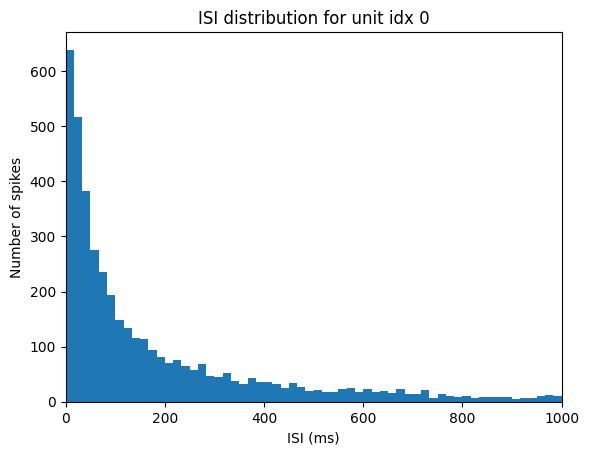

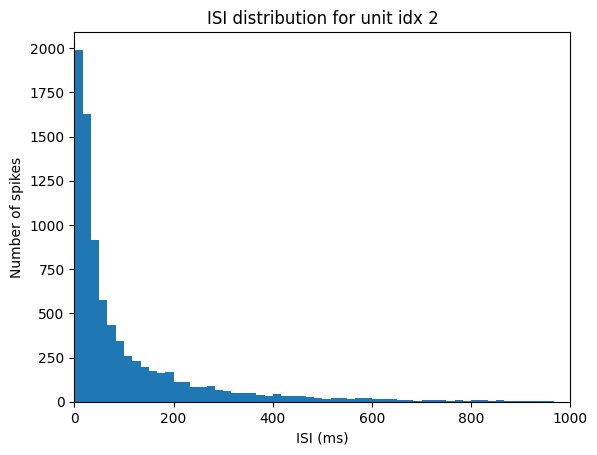

In [ ]:
# ISI dists
BINS = 60
RANGE = (0, 1000)
##
for unit in (UNIT1, UNIT2):
    unit.plot_isi_dist(bins=BINS, range=RANGE)
    # plt.ylim(0, 2000)
    plt.show()

337200.9666666667


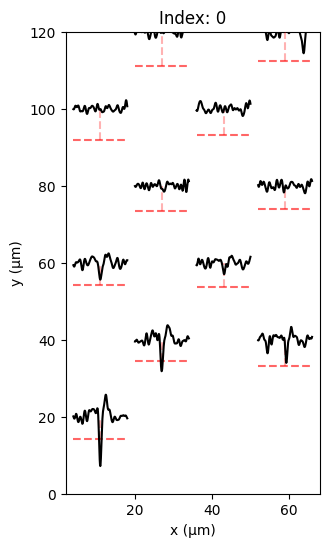

300514.93333333335


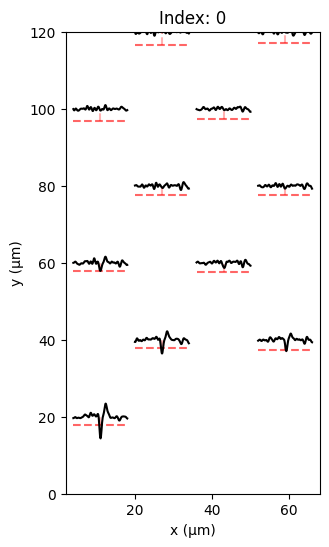

123496.8


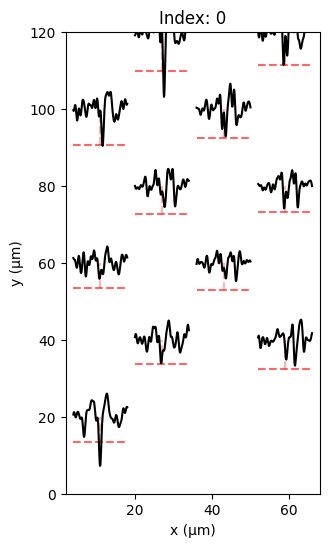

873447.4333333333


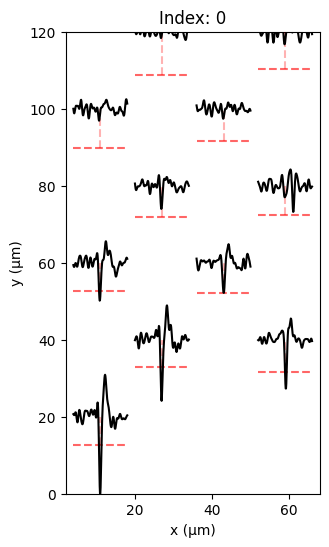

852356.8666666667


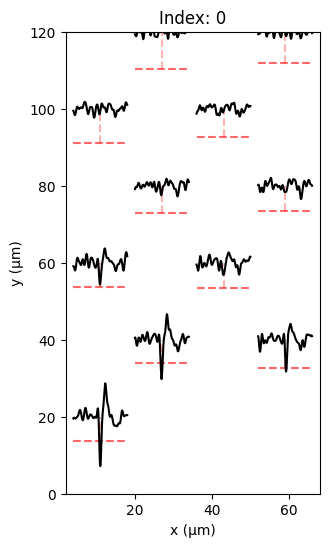

210749.26666666666


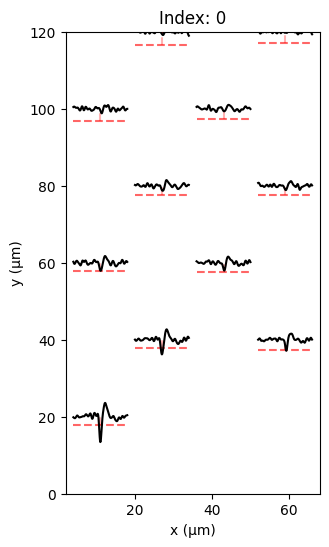

569359.9666666667


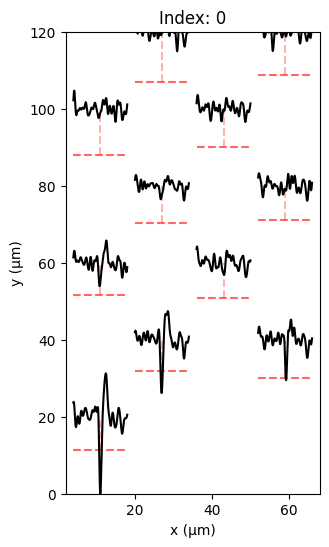

821709.4666666667


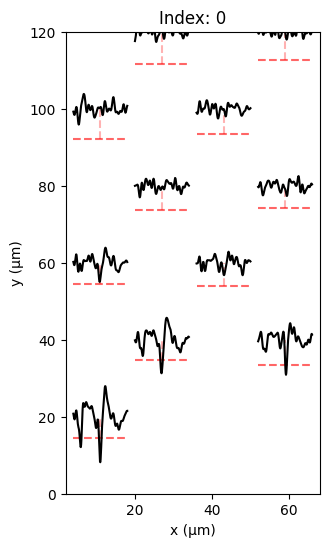

685310.4333333333


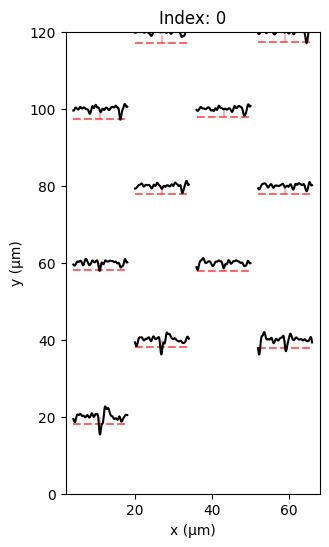

194591.73333333334


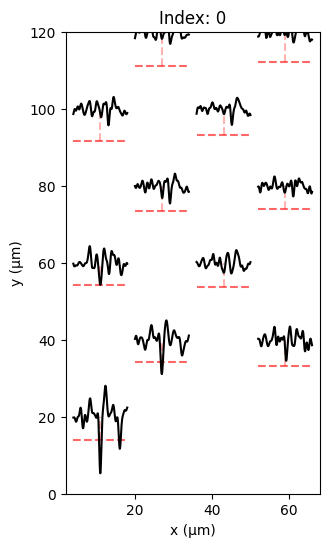

In [ ]:
MAX_PLOTS = 10
np.random.seed(101)
##
for st in np.random.choice(UNIT1.spike_train, size=MAX_PLOTS):
    print(st)
    UNIT1.plot(chans_rms=CHANS_RMS, time=st, ms_before=MS_BEFORE, ms_after=MS_AFTER)

151754.1


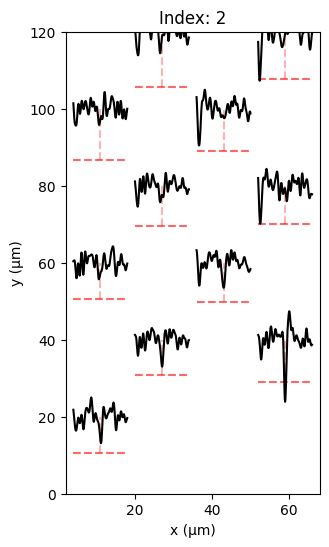

128057.33333333333


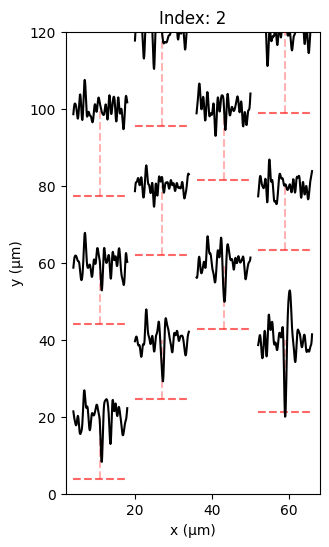

863166.8333333334


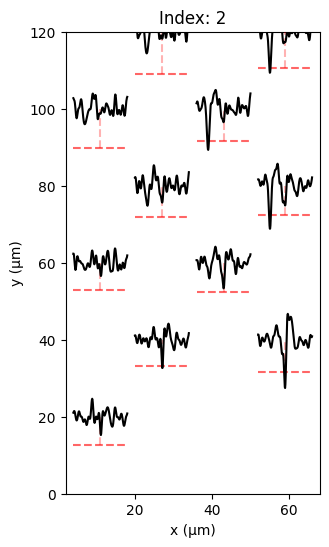

637441.2333333333


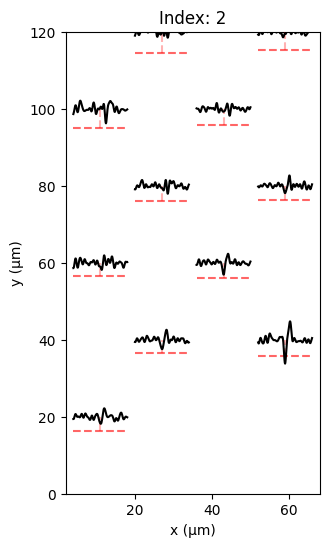

56479.96666666667


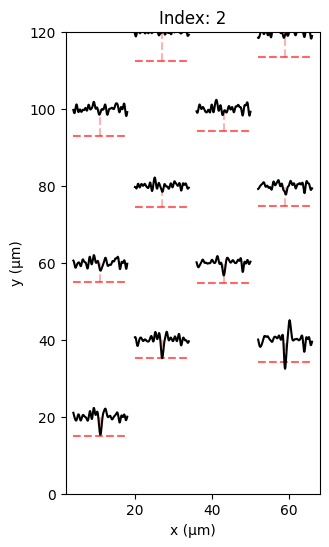

687116.2


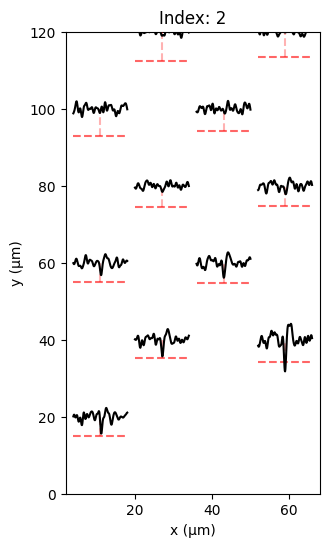

460048.8


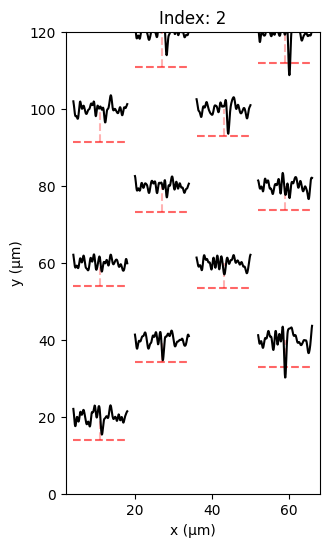

83125.8


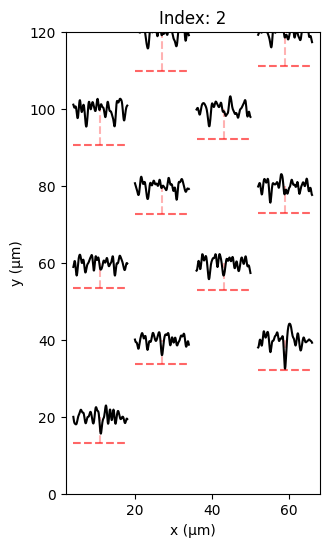

634854.3666666667


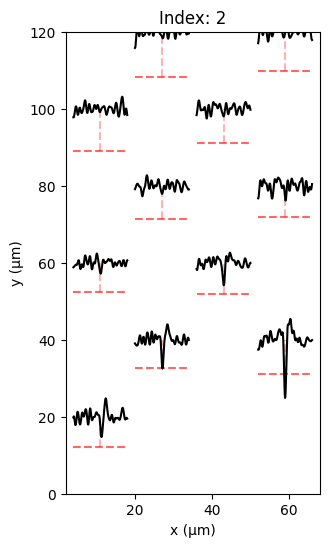

644791.8


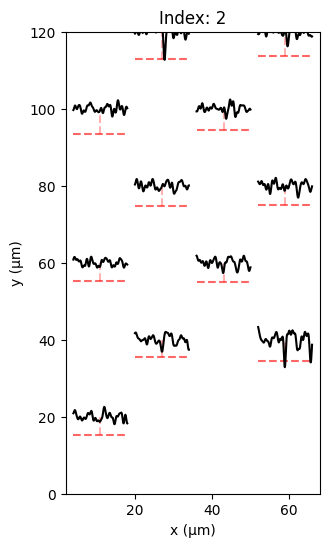

In [ ]:
MAX_PLOTS = 10
np.random.seed(101)
##
for st in np.random.choice(UNIT2.spike_train, size=MAX_PLOTS):
    print(st)
    UNIT2.plot(chans_rms=CHANS_RMS, time=st, ms_before=MS_BEFORE, ms_after=MS_AFTER)

898331.4666666667


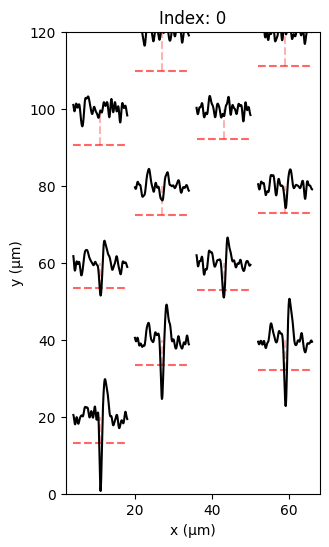

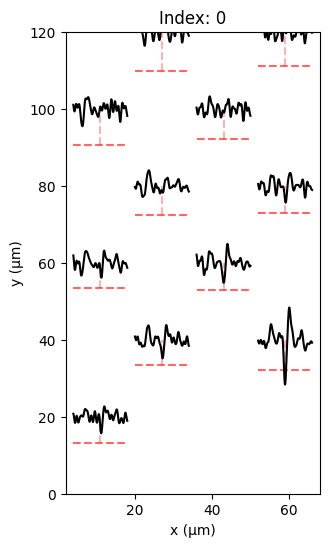

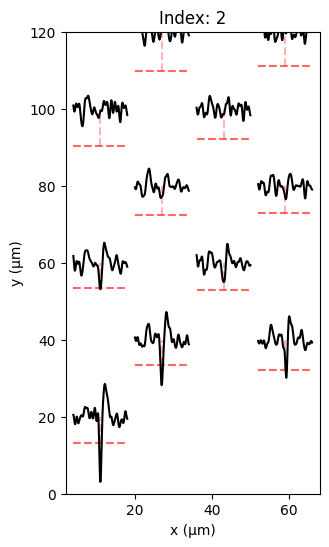

80219.7


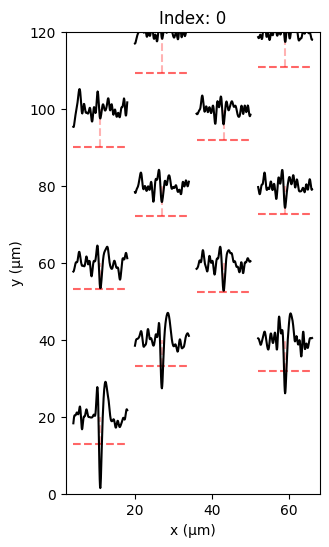

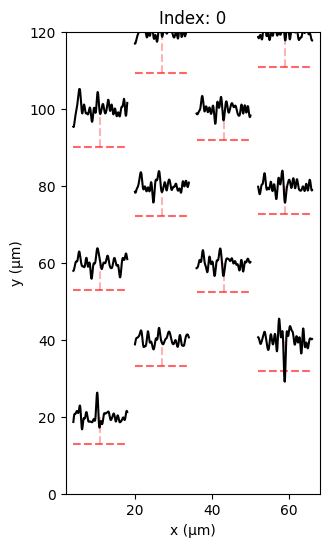

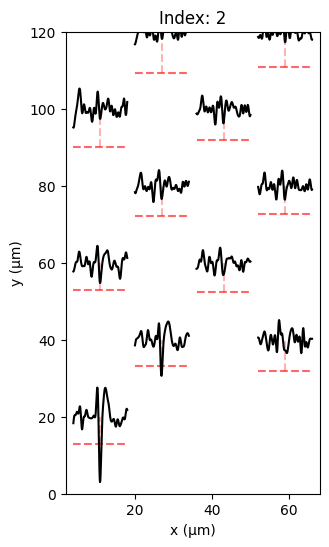

84875.46666666666


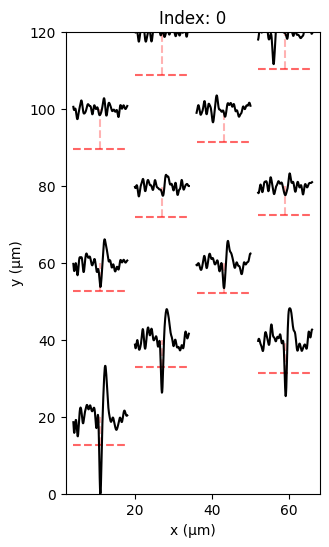

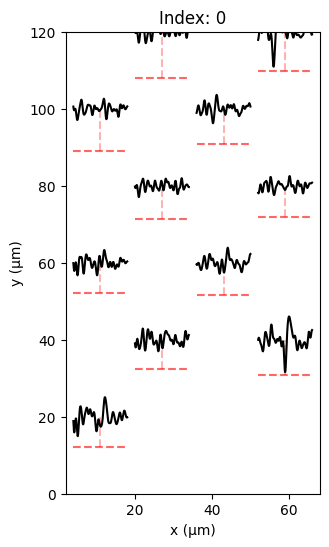

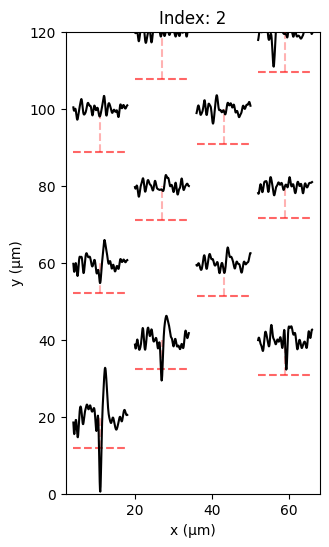

In [ ]:
MAX_PLOTS = 10
np.random.seed(101)
##
for st in same_spikes:
    print(st)
    UNIT1.plot(chans_rms=CHANS_RMS, time=st, ms_before=MS_BEFORE, ms_after=MS_AFTER, sub=None)
    UNIT1.plot(chans_rms=CHANS_RMS, time=st, ms_before=MS_BEFORE, ms_after=MS_AFTER, sub=UNIT1.templates)
    UNIT2.plot(chans_rms=CHANS_RMS, time=st, ms_before=MS_BEFORE, ms_after=MS_AFTER, sub=UNIT2.templates)

## Case study

## Case study

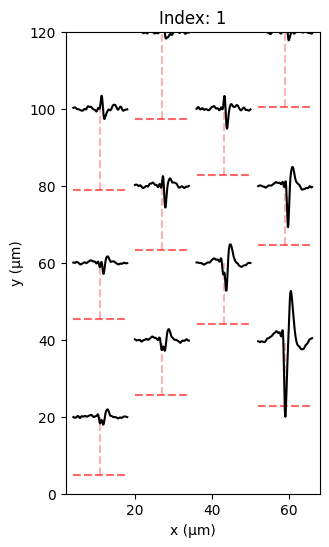

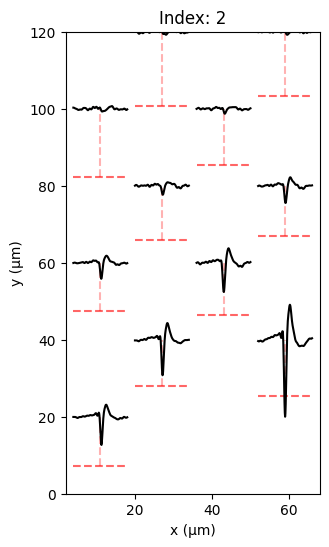

In [22]:
UNIT1 = ks_units[1]
UNIT2 = ks_units[2]

UNIT1.plot(chans_rms=CHANS_RMS)
UNIT2.plot(chans_rms=CHANS_RMS)

In [10]:
same_spikes = set(UNIT1.spike_train).intersection(UNIT2.spike_train)
print(
f"""# spikes:
Matches: {len(same_spikes)}
Unit {UNIT1.idx}: {len(UNIT1)}, {len(same_spikes)/len(UNIT1)*100:.1f}%
Unit {UNIT2.idx}: {len(UNIT2)}, {len(same_spikes)/len(UNIT2)*100:.1f}%
""")

# spikes:
Matches: 0
Unit 1: 13175, 0.0%
Unit 2: 8409, 0.0%



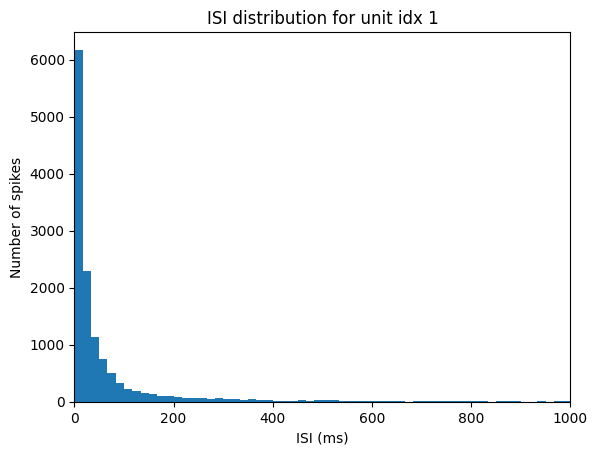

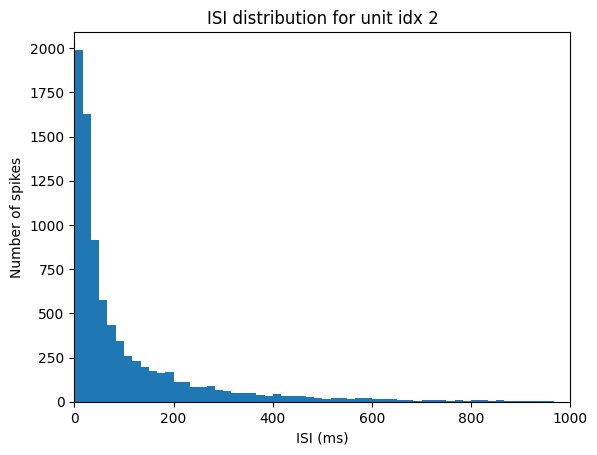

In [11]:
# ISI dists
BINS = 60
RANGE = (0, 1000)
##
for unit in (UNIT1, UNIT2):
    unit.plot_isi_dist(bins=BINS, range=RANGE)
    # plt.ylim(0, 2000)
    plt.show()

898344.0


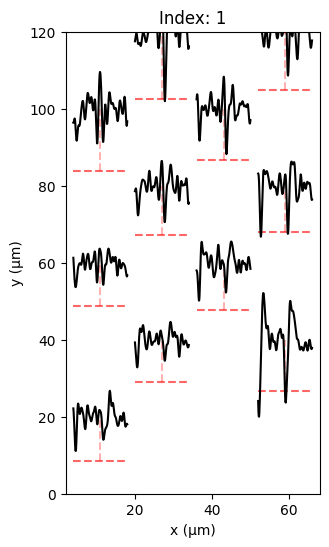

139496.43333333332


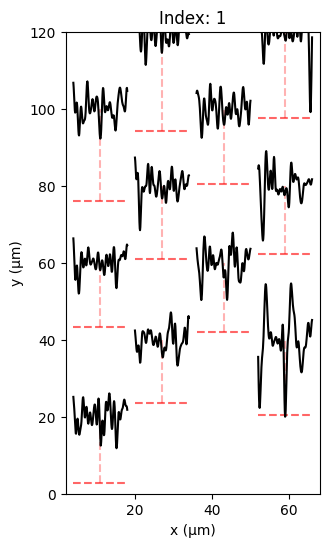

123877.76666666666


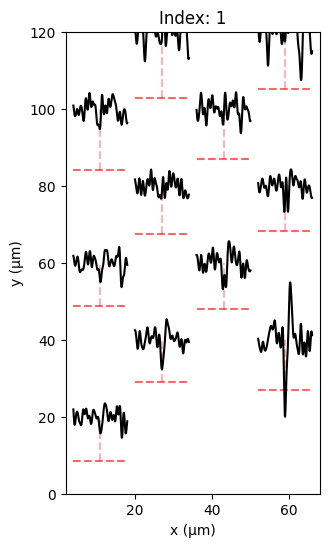

566820.8666666667


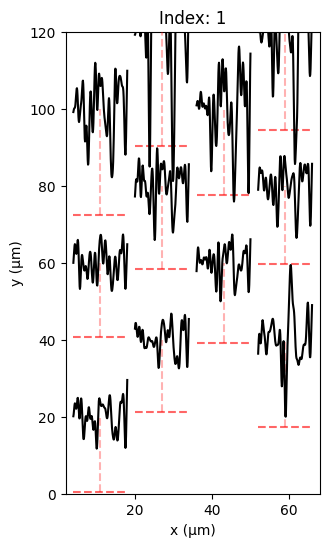

401418.06666666665


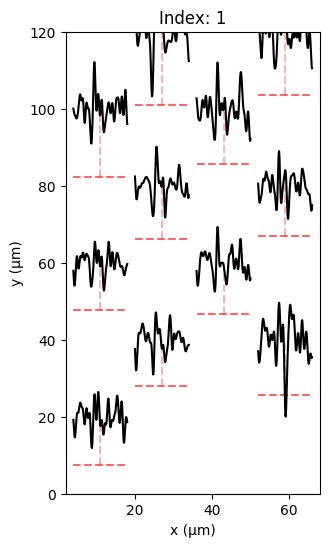

81586.2


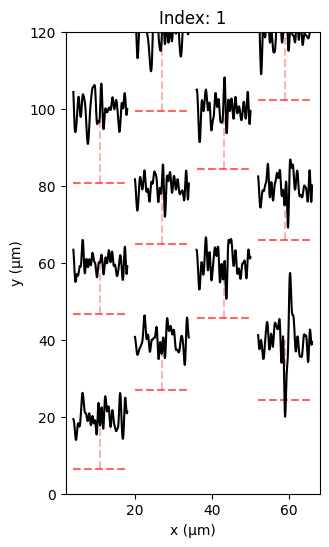

433728.4666666667


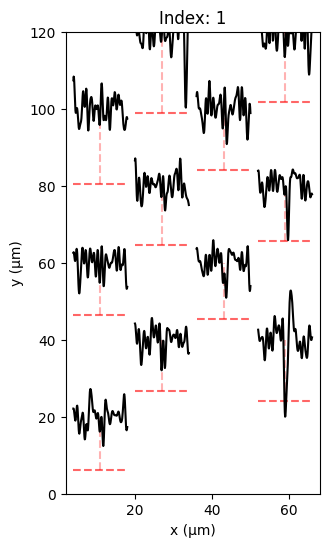

848063.5


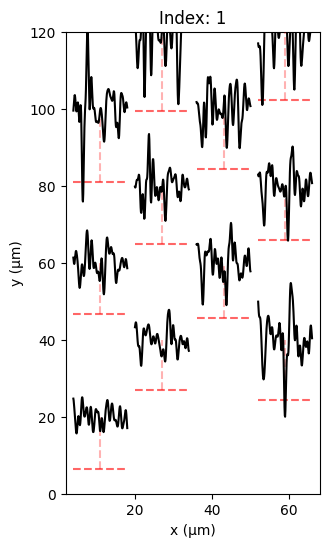

303866.6666666667


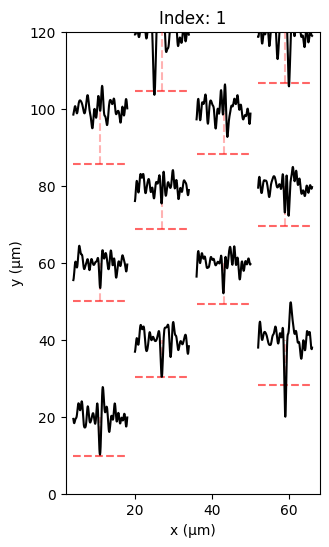

99958.8


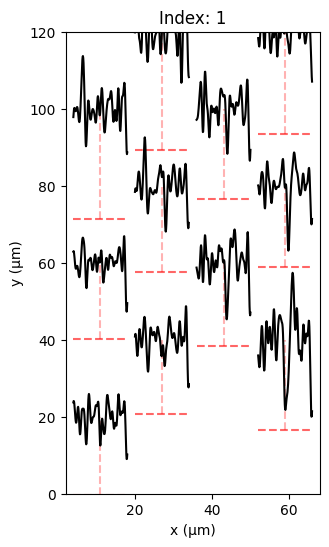

In [20]:
MAX_PLOTS = 10
np.random.seed(101)
##
for st in np.random.choice(UNIT1.spike_train, size=MAX_PLOTS):
    print(st)
    UNIT1.plot(chans_rms=CHANS_RMS, time=st, ms_before=MS_BEFORE, ms_after=MS_AFTER)

151754.1


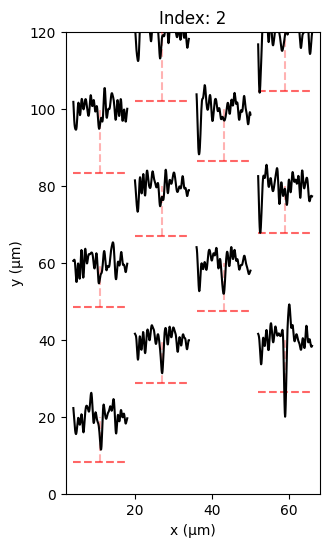

128057.33333333333


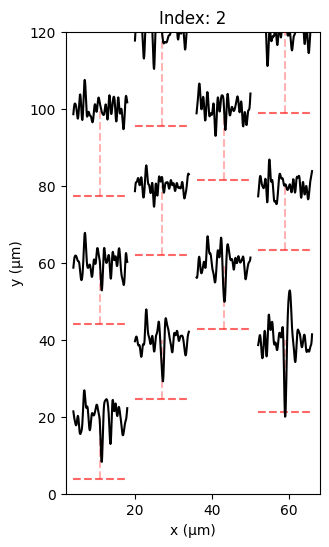

863166.8333333334


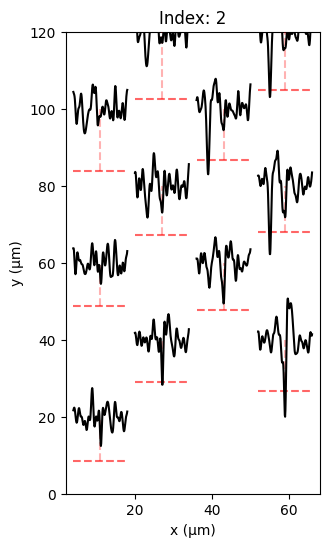

637441.2333333333


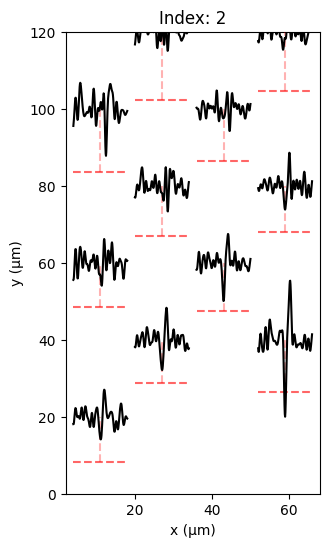

56479.96666666667


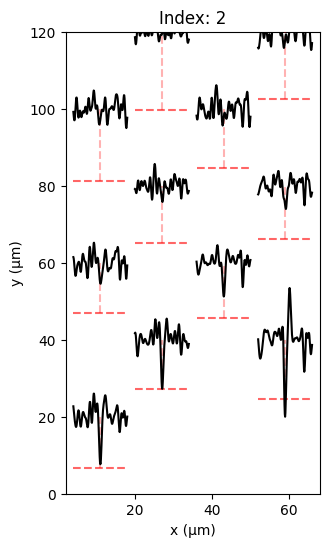

687116.2


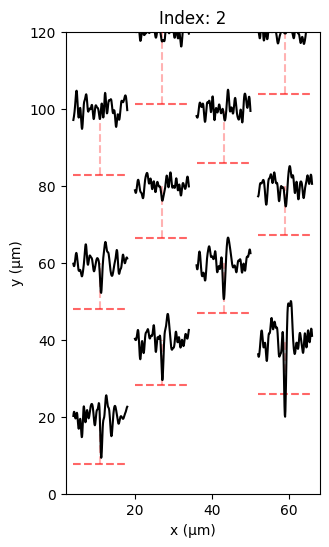

460048.8


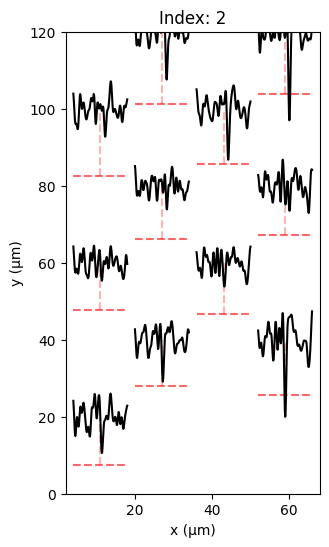

83125.8


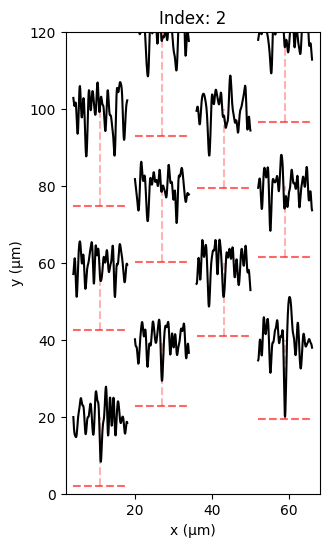

634854.3666666667


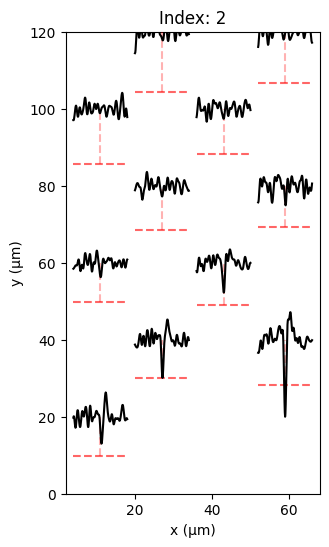

644791.8


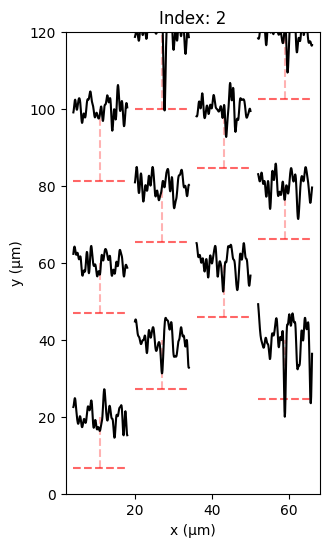

In [21]:
MAX_PLOTS = 10
np.random.seed(101)
##
for st in np.random.choice(UNIT2.spike_train, size=MAX_PLOTS):
    print(st)
    UNIT2.plot(chans_rms=CHANS_RMS, time=st, ms_before=MS_BEFORE, ms_after=MS_AFTER)

In [ ]:
MAX_PLOTS = 10
np.random.seed(101)
##
for st in same_spikes:
    print(st)
    UNIT1.plot(chans_rms=CHANS_RMS, time=st, ms_before=MS_BEFORE, ms_after=MS_AFTER, sub=None)
    UNIT1.plot(chans_rms=CHANS_RMS, time=st, ms_before=MS_BEFORE, ms_after=MS_AFTER, sub=UNIT1.templates)
    UNIT2.plot(chans_rms=CHANS_RMS, time=st, ms_before=MS_BEFORE, ms_after=MS_AFTER, sub=UNIT2.templates)

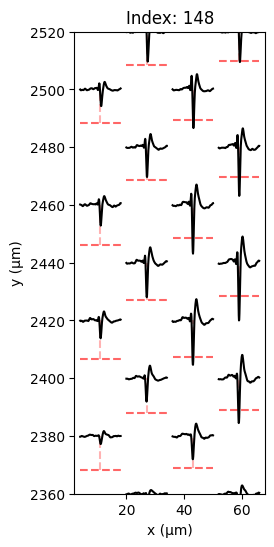

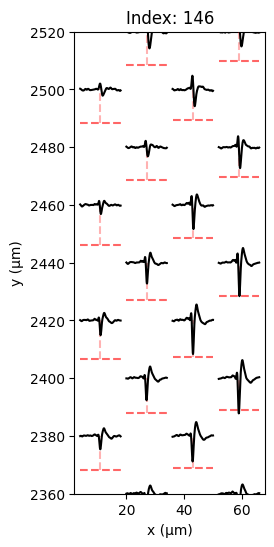

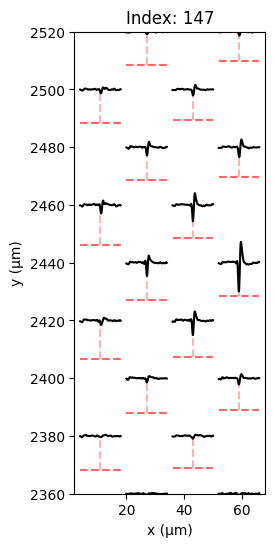

In [109]:
kwargs = ks_units[148].plot(chans_rms=CHANS_RMS, ms_before=MS_BEFORE, ms_after=MS_AFTER, return_kwargs=True)
for unit in ks_units[[146, 147]]:
    unit.plot(**kwargs)

In [89]:
UNIT1 = ks_units[146]
UNIT2 = ks_units[148]

In [83]:
same_spikes = set(UNIT1.spike_train).intersection(UNIT2.spike_train)
print(
f"""Sames: {len(same_spikes)}
Unit 1: {len(UNIT1)}, {len(same_spikes)/len(UNIT1)*100:.1f}%
Unit 2: {len(UNIT2)}, {len(same_spikes)/len(UNIT2)*100:.1f}%
""")

Sames: 0
Unit 1: 14583, 0.0%
Unit 2: 1992, 0.0%



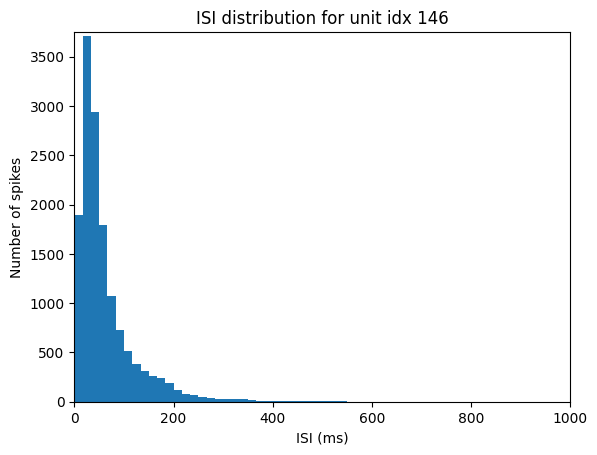

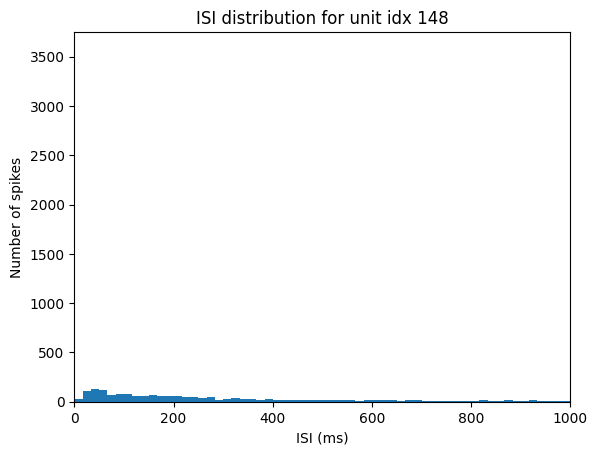

In [90]:
# ISI dists
BINS = 60
RANGE = (0, 1000)
##
for unit in (UNIT1, UNIT2):
    unit.plot_isi_dist(bins=BINS, range=RANGE)
    plt.ylim(0, 3750)
    plt.show()

800819.7333333333


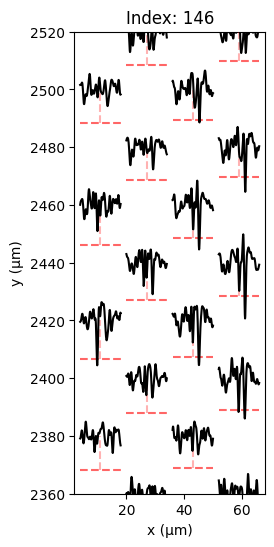

79203.1


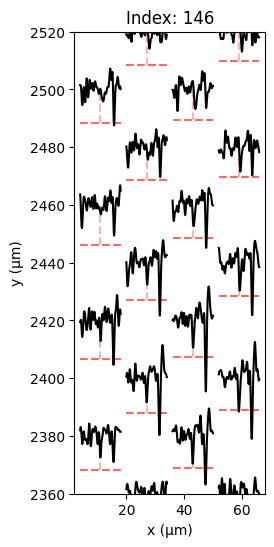

71493.13333333333


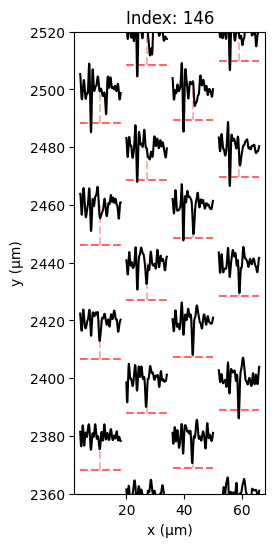

468045.6


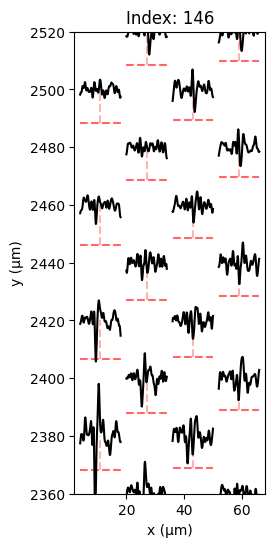

321191.0


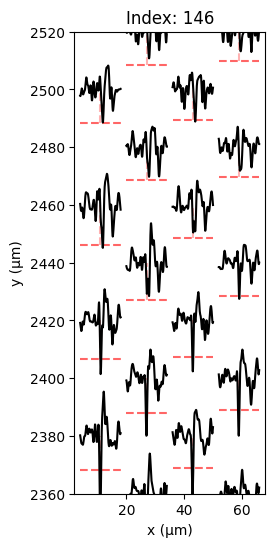

30579.466666666667


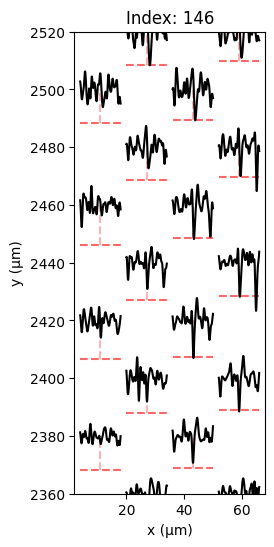

351012.7


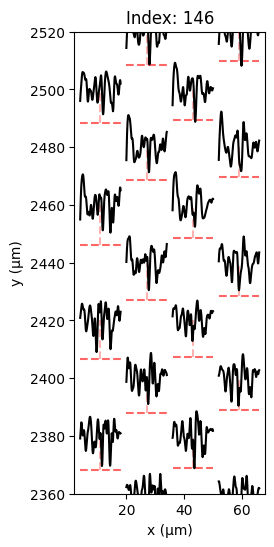

750845.0


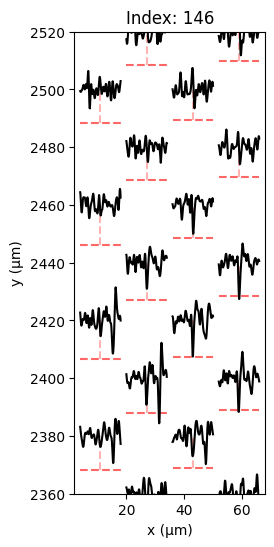

231963.23333333334


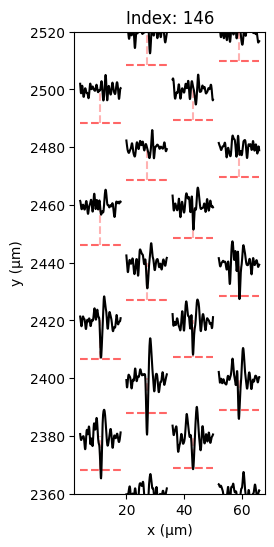

49907.5


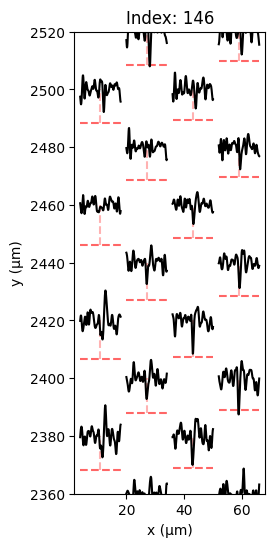

In [111]:
MAX_PLOTS = 10
np.random.seed(101)
##
for st in np.random.choice(UNIT1.spike_train, size=MAX_PLOTS):
    print(st)
    UNIT1.plot(time=st, **kwargs)

Recording does not have scaled traces. Setting gain to 0.195
799518.2


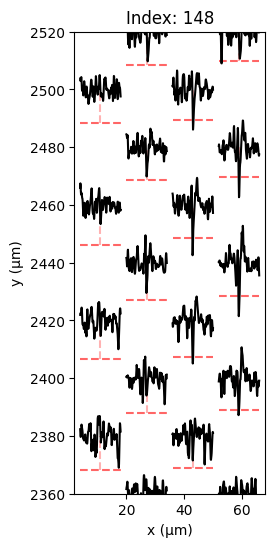

645448.6666666666


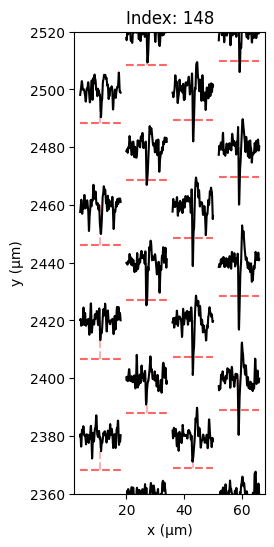

385487.93333333335


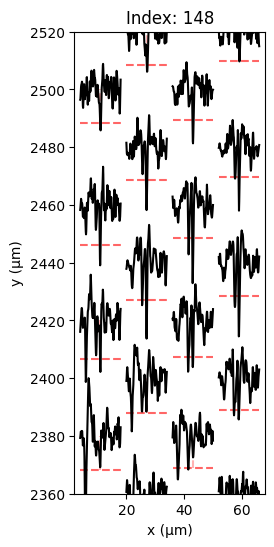

281358.8333333333


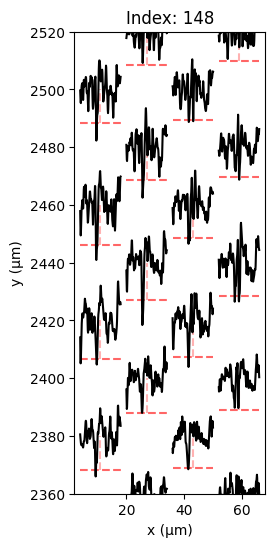

848132.6333333333


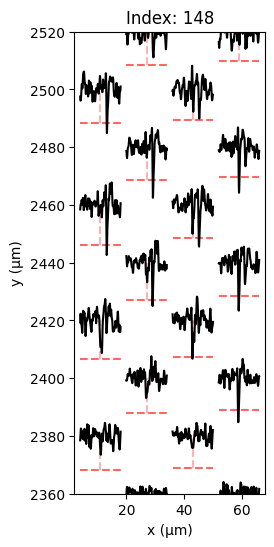

404957.23333333334


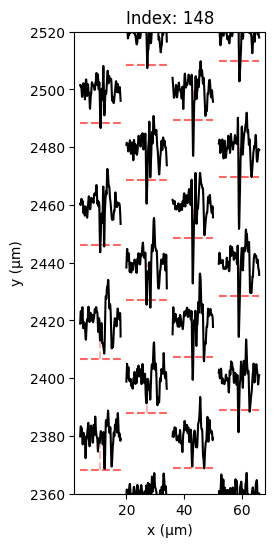

773153.0666666667


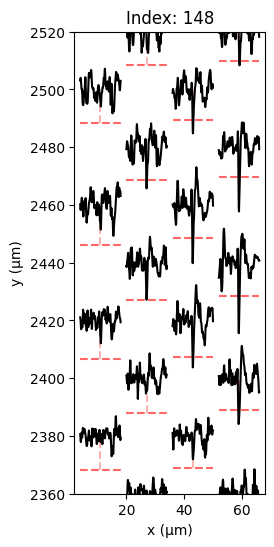

763741.5


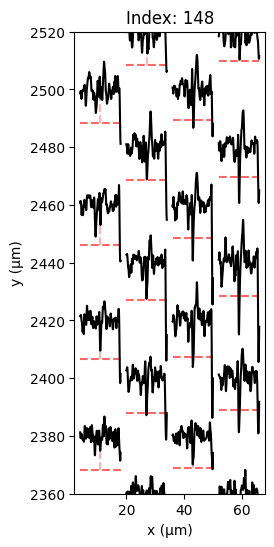

491434.4


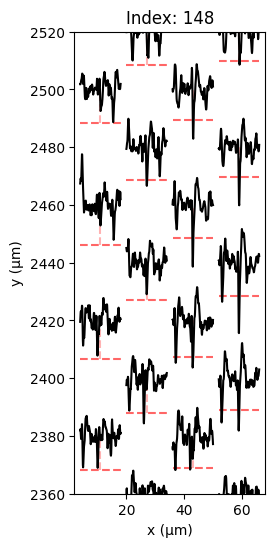

711875.6666666666


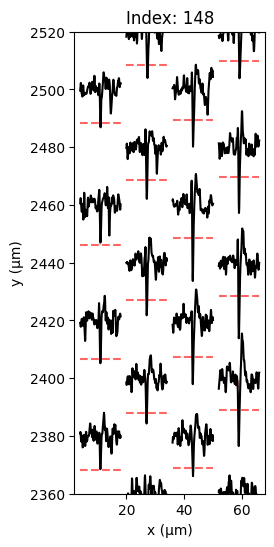

In [117]:
MAX_PLOTS = 10
np.random.seed(231)
##

from src.recording import Recording
test = Recording("/data/MEAprojects/dandi/000034/sub-mouse412804/sub-mouse412804_ecephys.nwb", freq_max=6000)
UNIT2.recording = test

for st in np.random.choice(UNIT2.spike_train, size=MAX_PLOTS):
    print(st)
    UNIT2.plot(time=st, **kwargs)

/home/mea/anaconda3/envs/prop/lib/python3.7/site-packages/hdmf/spec/namespace.py:456: UserWarning: ignoring namespace 'hdmf-common' because it already exists
  warn("ignoring namespace '%s' because it already exists" % ns['name'])
/home/mea/anaconda3/envs/prop/lib/python3.7/site-packages/hdmf/spec/namespace.py:456: UserWarning: ignoring namespace 'core' because it already exists
  warn("ignoring namespace '%s' because it already exists" % ns['name'])


Recording does not have scaled traces. Setting gain to 0.195
799518.2


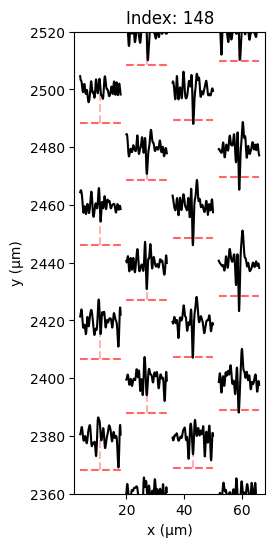

645448.6666666666


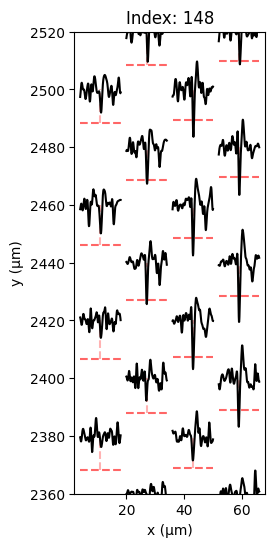

385487.93333333335


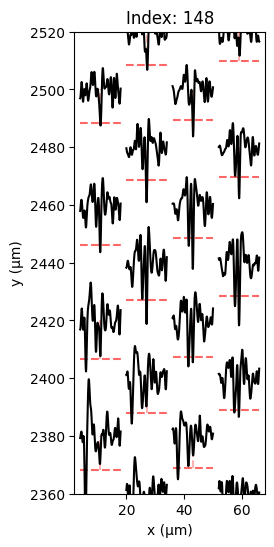

281358.8333333333


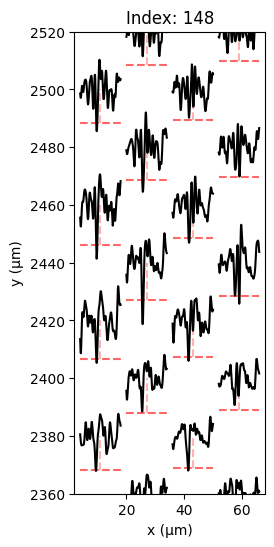

848132.6333333333


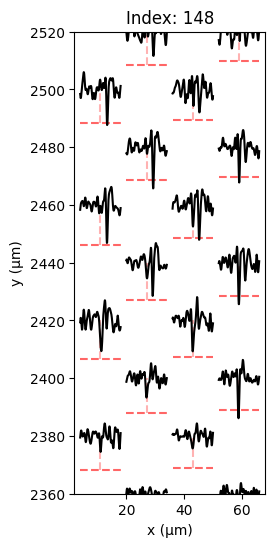

404957.23333333334


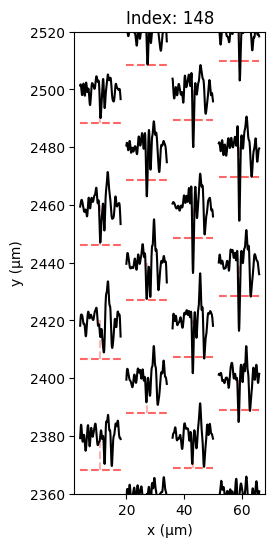

773153.0666666667


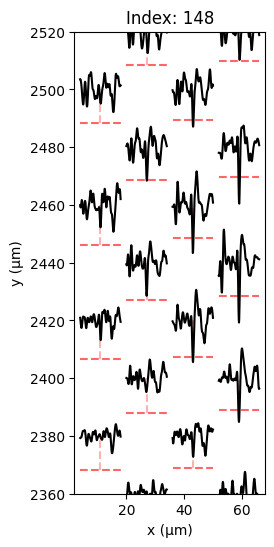

763741.5


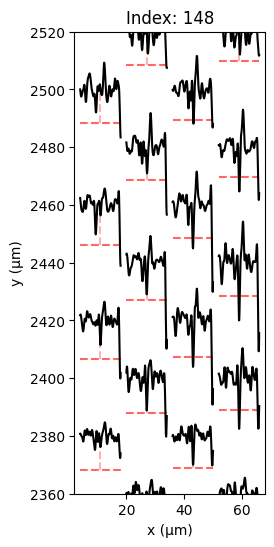

491434.4


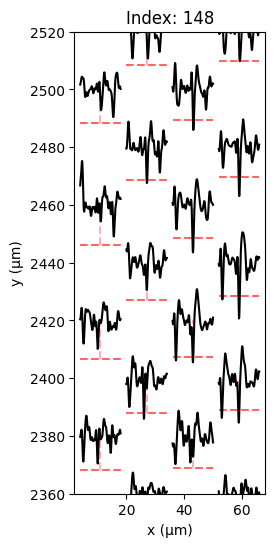

711875.6666666666


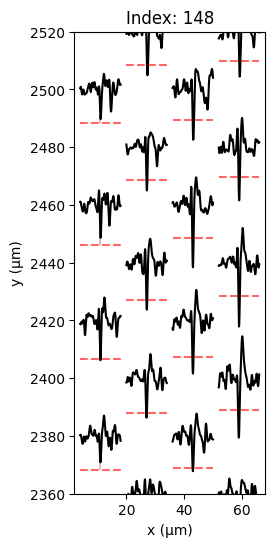

In [118]:
MAX_PLOTS = 10
np.random.seed(231)
##

from src.recording import Recording
test = Recording("/data/MEAprojects/dandi/000034/sub-mouse412804/sub-mouse412804_ecephys.nwb", freq_max=3000)
UNIT2.recording = test

for st in np.random.choice(UNIT2.spike_train, size=MAX_PLOTS):
    print(st)
    UNIT2.plot(time=st, **kwargs)

In [113]:
MAX_PLOTS = 10
np.random.seed(101)
##
for st in same_spikes:
    print(st)
    UNIT1.plot(chans_rms=CHANS_RMS, time=st, ms_before=MS_BEFORE, ms_after=MS_AFTER, sub=None)
    UNIT1.plot(chans_rms=CHANS_RMS, time=st, ms_before=MS_BEFORE, ms_after=MS_AFTER, sub=UNIT1.templates)
    UNIT2.plot(chans_rms=CHANS_RMS, time=st, ms_before=MS_BEFORE, ms_after=MS_AFTER, sub=UNIT2.templates)

## Waveform footprints of single channel crossings

In [119]:
CROSS_TIMES = np.load("/data/MEAprojects/dandi/000034/sub-mouse412804/prop_signal/thresh_5_full/crossings.npy", allow_pickle=True)

[11. 20.]


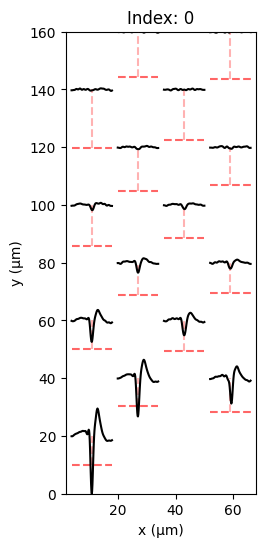

[ 43. 540.]


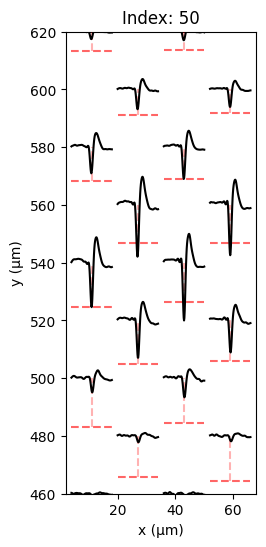

[  27. 1280.]


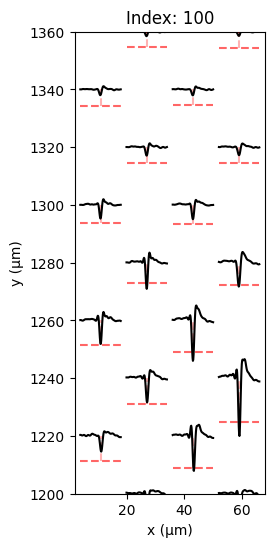

[  59. 2360.]


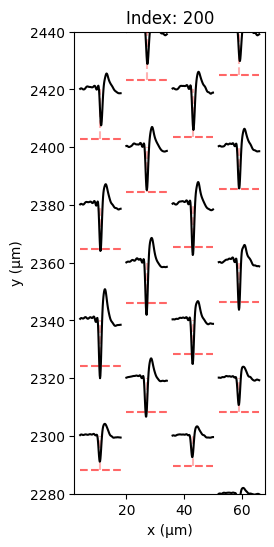

In [131]:
from src.sorters.base import Unit

for chan_idx in [0, 50, 100, 200]:
    chan = Unit(
        idx=chan_idx,
        spike_train=CROSS_TIMES[chan_idx],
        channel_idx=chan_idx,
        recording=KILOSORT.recording
    )
    print(chan.recording.get_channel_locations()[chan_idx])
    chan.plot(chans_rms=CHANS_RMS)